# Machine Learning for Computer Vision Assignment 2025-2026 
Student ID: 1900140531 \
Student Name: Yingwen PENG \
Institutional Email: peng.yingwen@studio.unibo.it

# Pre-experiment Settings

## Download And Import Dependencies

In [2]:
!pip install torchreid

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.7/92.7 kB 2.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for torchreid: filename=torchreid-0.2.5-py3-none-any.whl size=144324 sha256=505772d3b2e67724919b33eabc1081bd8ccfe454d09f42bfd9c627ced9305d62
  Stored in directory: /root/.cache/pip/wheels/5c/86/ff/80a1b78a90df470cbb12c075bf189ad33f1a41a881cf9e9a09
Successfully built torchreid


In [5]:
import os
import gc
import random
import torch
import os.path as osp
import pandas as pd
from torch.utils.data import Dataset, DataLoader
from pathlib import Path
from typing import List, Tuple, Callable, Optional
from scipy.io import loadmat

import numpy as np
import copy
import matplotlib.pyplot as plt
import ipywidgets as widgets
from ipywidgets import interact
from PIL import Image, ImageDraw, ImageFont

import torchvision
from torchvision.transforms import v2
from torchvision.models.detection import FasterRCNN_ResNet50_FPN_Weights, FasterRCNN_ResNet50_FPN_V2_Weights

import torch.nn as nn
from matplotlib import rcParams

import torchreid
import torch.nn.functional as F
from tqdm.auto import tqdm
from torchvision.transforms import ToPILImage

import wandb
import pickle
from kaggle_secrets import UserSecretsClient
import torch.optim as optim
from torch.optim import lr_scheduler


In [7]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print(device)

cuda


## Reproducibility & deterministic mode


In [8]:
def fix_random(seed: int) -> None:
    """Fix all the possible sources of randomness.

    Args:
        seed: the seed to use.
    """
    np.random.seed(seed)
    random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)

    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True

fix_random(seed=0)

## Visualization Functions

In [9]:
def draw_boxes(
    image: Image,
    boxes: List[List[float]],
    pids: List[int],
    scores: List[float],
    normalized_coordinates: bool,
    add_text: bool = True) -> Image:
    """Draws a rectangle around each object together with the id
    and the prediction score using a different color for each category.

    Args:
        image: the input image.
        boxes: the bounding boxes in the format [x_min, y_min, x_max, y_max]
               for all the objects in the image.
        pids: the ids for all the objects in the image.
        scores: the predicted scores for all the objects in the image.
        normalized_coordinates: if true the coordinates are multiplied
                                according to the height and width of the image.
        add_text: if true add a box with the id and the score.

    Returns:
        The generated image.
    """
    if boxes is None or len(boxes) == 0:
        return copy.deepcopy(image)
    
    font_size = 25
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationMono-Regular.ttf", size=font_size)
    image_with_bb = copy.deepcopy(image)
    painter = ImageDraw.Draw(image_with_bb)

    for i, (box, id) in enumerate(zip(boxes, pids)):
        x_min, y_min, x_max, y_max = box

        if normalized_coordinates:
            width, height = image.size
            x_min *= width
            y_min *= height
            x_max *= width
            y_max *= height

        painter.rectangle(
            [x_min, y_min, x_max, y_max],
            outline = 'lime',
            width = 4
        )

        if add_text:
            id_obj = pids[i]
            score = scores[i]
            text_in_box = f"id:{id_obj}, score:{score:.2f}"
            painter.text(
                (x_min, y_min-25),
                text_in_box, 
                fill = 'lime',
                font = font
            )
    return image_with_bb

In [10]:
class DatasetVisualizer:
    """A utility class to visualize images and bounding box annotations from a dataset.
    """
    def __init__(self, 
                 dataset, 
                 dataset_split: str, 
                 dets = None):
        """Initializes the visualizer with dataset information and optional detections.

        Args:
            dataset: The dataset object containing images and annotations.
            dataset_split: The split of the dataset to use (e.g., 'train' or 'test').
            dets: Optional list of external detection results to be visualized.
        """
        self.dataset = dataset
        self.dets = dets
        self.dataset_split = dataset_split
        
    def start(self):
        """Launches an interactive slider to browse and plot images with 
        their corresponding bounding boxes and labels.
        """
        @interact(idx=(0, 5))
        def _plot(idx):
            img, anno = self.dataset[idx]
            img = v2.ToPILImage()(img)

            if self.dataset_split == "train": 
                scores = [1.0] * len(anno["boxes"])
                boxes = anno["boxes"]
                pids = anno["pids"]
                
            elif self.dataset_split == "test":
                if self.dets is not None and len(self.dets) > idx:
                    dets = self.dets[idx]
                    if len(dets) > 0:
                        boxes = dets[:, :4]
                        scores = dets[:, 4]
                        pids = [-2]* len(boxes)
                else:
                    boxes = anno.get("boxes", [])
                    pids = anno.get("pids", [])
                    scores = [0.0] * len(boxes)
                
            cell_with_bb = draw_boxes(
                image = img,
                boxes = boxes,
                pids = pids,
                scores = scores,
                normalized_coordinates=False
            )

            plt.imshow(cell_with_bb)
            plt.axis("off")
            plt.show()

In [6]:
import matplotlib.pyplot as plt
import cv2
from PIL import Image

def visualize_results(ret, img_root, query_indices=None):
    """
    Args:
        ret: eval_search_prw results
        img_root: PRW dataset image root
        query_indices: show results of which query indices
    """
    results = ret["results"]

    if query_indices is None:
        query_indices = range(min(3, len(results)))
    
    for i in query_indices:
        if i >= len(results):
            print(f"Warning: Index {i} is out of range for results (len={len(results)})")
            continue
        
        res = results[i]
        
        fig, axes = plt.subplots(1, 4, figsize=(20, 5))
        
        query_box_root = "/kaggle/input/prw-person-re-identification-in-the-wild/query_box"
        q_path = osp.join(query_box_root, str(res["query_pid"]) + "_" + res["query_img"] + ".jpg")
        q_img = cv2.cvtColor(cv2.imread(q_path), cv2.COLOR_BGR2RGB)
        
        axes[0].imshow(q_img)
        axes[0].set_title(f"Query: {res['query_img']}\nPID: {res['query_pid']}")
        axes[0].axis('off')

        # Show top-3 results
        for k in range(3):
            g_data = res["gallery"][k]
            g_path = osp.join(img_root, g_data["img"] + ".jpg")
            g_img = cv2.cvtColor(cv2.imread(g_path), cv2.COLOR_BGR2RGB)
            gx1, gy1, gx2, gy2, _ = map(int, g_data["roi"])
            
            # Green: True Positive, Black: False Positive
            color = (0, 255, 0) if g_data["correct"] else (0, 0, 0)
            cv2.rectangle(g_img, (gx1, gy1), (gx2, gy2), color, 4)
            
            # show info
            axes[k+1].imshow(g_img)
            axes[k+1].set_title(
                f"Rank-{k+1} (Sim: {g_data['score']:.2f})\n"
                f"IoU: {g_data['iou']:.2f} | TP: {bool(g_data['correct'])}"
            )
            axes[k+1].axis('off')
            
        plt.tight_layout()
        plt.show()

# Build The Datasets

In [12]:
def switch_box(x_min, y_min, w, h):
    """Converts bounding box format from [x_min, y_min, w, h] to [x_min, y_min, x_max, y_max].
    
    Args: 
        x_min, y_min (float), w (width), h (height). 
    
    Returns: 
        A list of four float coordinates.
    """
    x_max = x_min + w
    y_max = y_min + h

    return [float(x_min), float(y_min), float(x_max), float(y_max)]

In [13]:
def parse_annotations_file(path_to_file: Path) -> Tuple[List[str], List[List[float]]]:
    """
    Args:
        path_to_file: the path to the file with the annotations.

    Returns:
        The id for each object in the image.
        The bounding boxes coordinates for each object in the image in
        [x_min, y_min, x_max, y_max] format, with values between 0 and H and 0 and W.
    """
    contents = loadmat(path_to_file)
    boxes = []
    if "box_new" in contents:
        boxes = contents["box_new"]
    elif "anno_file" in contents:
        boxes = contents["anno_file"]

    obj_ids, obj_boxes  = [], []
    
    for i, box in enumerate(boxes):
        person_id = int(box[0])
        x_min, y_min, w, h = box[1:5]
        coordinates = switch_box(x_min, y_min, w, h)
    
        obj_ids.append(person_id)
        obj_boxes.append(coordinates)

    return obj_ids, obj_boxes

In [14]:
class prw_gallery_dataset(Dataset):
    """Dataset class for building the PRW training and gallery datasets.
    """
    def __init__(
        self, 
        path_file: Path,
        dataset_split: str,
        transforms: Optional[Callable] = None
    )-> None:
        """Initializes the dataset by loading frame indices and parsing corresponding annotation files.

        Args:
            path_file: Base directory path containing frames, annotations, and split MAT files.
            dataset_split: The split to load, typically 'train' or 'test'.
            transforms: Optional image transformation pipeline.
        """
        self.path_file = path_file
        self.dataset_split = dataset_split
        self.transforms = transforms

        img_idx_name = 'img_index_' + self.dataset_split
        frames_raw = loadmat(f'{self.path_file}/frame_{self.dataset_split}.mat')[img_idx_name]
        
        self.img_prefix = [img[0][0] for img in frames_raw]
        self.annotations = []
        for img_name in self.img_prefix:
            path_annos = self.path_file / 'annotations' / f'{img_name}.jpg.mat'
            pids, boxes = parse_annotations_file(str(path_annos))
            cam_id = int(img_name[1]) 
            self.annotations.append({
                "img_name": img_name,
                "boxes": torch.as_tensor(boxes, dtype=torch.float32),
                "pids": torch.as_tensor(pids, dtype=torch.int64),
                "cam_id": cam_id
            })

    def __len__(self):
        """Returns the total number of images in the dataset split."""
        return len(self.annotations)

    def __getitem__(self, idx):
        """Retrieves the image and its associated annotations for a given index.

        Returns:
            the ith transformed image and its annotation dictionary.
        """
        anno = self.annotations[idx]
        img_name = anno["img_name"]

        path_frame = self.path_file / 'frames' / f'{img_name}.jpg'
        frame = Image.open(path_frame).convert('RGB')
        
        if self.transforms is not None: 
            frame = self.transforms(frame)

        return frame, anno

In [15]:
class prw_query_dataset(Dataset):
    """Dataset class for building the PRW query dataset.
    """
    def __init__(
        self, 
        path_file: Path,
        transforms: Optional[Callable] = None
    )-> None:
        """Initializes the dataset by parsing query information from a text file.

        Args:
            path_file: Base directory path containing the 'query_info.txt' and 'query_box' folder.
            transforms: Optional image transformation pipeline.
        """
        self.path_file = path_file
        self.transforms = transforms

        query_info_path = os.path.join(path_file, "query_info.txt")
        with open(query_info_path, 'r') as f:
            lines = f.readlines()

        self.annotations = []
        self.img_prefix = []
        for line in lines:
            line = line.strip().split()
            pids = int(line[0])
            img_name = line[5]
            x_min, y_min, w, h = line[1:5]
            boxes = switch_box(float(x_min), float(y_min), float(w), float(h))
            cam_id = int(img_name[1]) 
            
            self.annotations.append({
                "img_name": img_name,
                "boxes": torch.as_tensor(boxes, dtype=torch.float32),
                "pids": torch.as_tensor(pids, dtype=torch.int64),
                "cam_id": cam_id
            })

            img_prefix = str(pids) + "_" + img_name
            self.img_prefix.append(img_prefix)

    
    def __len__(self):
        return len(self.annotations)

    def __getitem__(self, idx):
        """Retrieves the image and its associated annotations for a given index.

        Returns:
            the ith transformed image and its annotation dictionary.
        """
        anno = self.annotations[idx]
        img_name = self.img_prefix[idx]

        path_frame = self.path_file / 'query_box' / f'{img_name}.jpg'
        frame = Image.open(path_frame).convert('RGB')
        
        if self.transforms is not None: 
            frame = self.transforms(frame)

        return frame, anno

# Object Detection

In [16]:
def detect_objects(
    images: List[torch.Tensor],
    detector: nn.Module
) -> Tuple[List[List[int]], List[int], List[float], List[str]]:
    """Detects objects in the image using the provided detector.
    This function puts the model in the eval mode.

    Args:
        image: the input image.
        detector: the object detector.

    Returns:
        predictions list including
            The predicted bounding boxes in the [x_min, y_min, x_max, y_max] format, with values between 0 and H and 0 and W.
            The predicted labels.
            The predicted scores.
    """
    all_predictions = []
    
    predictions = detector(images)

    for pred in predictions:
        result = {
            'boxes': pred['boxes'].detach().cpu().numpy(),
            'labels': pred["labels"].cpu().numpy(),
            'scores': pred["scores"].detach().cpu().numpy()
        }
        all_predictions.append(result)
    
    return all_predictions

In [17]:
def filter_bb(
    pred: dict,
    score_thresh: float
):
    """This function is to filter the predicted bounding box given score threshold.
    
    Args:
        pred: A dictionary containing 'labels', 'scores', and 'boxes'.
        score_thresh: The minimum score required to keep a detection.

    Returns:
        final_boxes, final_scores containing only detections that meet the criteria.
    """
    keep = (pred['labels'] == 1) & (pred['scores'] > score_thresh)
    final_boxes = pred['boxes'][keep]
    final_scores = pred['scores'][keep]

    return final_boxes, final_scores

In [18]:
def object_detection_loop(
    detector: nn.Module,
    dataloader: DataLoader,
    device: device,
    score_thresh: float
):
    """Runs the object detection inference pipeline on test dataset and filters results.

    Args:
        detector: The neural network model used for detection.
        dataloader: PyTorch DataLoader providing batches of images and annotations.
        device: The target device (CPU/GPU) for inference.
        score_thresh: Confidence threshold to filter out low-quality detections.

    Returns:
        gallery_dets: A list of [x1, y1, x2, y2, score] arrays for each image.
        name_to_dets: A dictionary mapping image names to their corresponding detection arrays.
    """
    device = device
    detector.to(device)
    print("Detector loaded.")

    gallery_dets = []
    name_to_dets = {}

    with torch.no_grad():
        for img, annos in tqdm(dataloader):
            imgs = [i.to(device) for i in img]
            img_names = [a['img_name'] for a in annos]
    
            all_predictions = detect_objects(imgs, detector)
            
            for pred, name in zip(all_predictions, img_names):
                boxes, scores = filter_bb(pred, score_thresh)
                
                if len(boxes) > 0:
                    det_with_scores = np.column_stack([boxes, scores])
                else:
                    det_with_scores = np.empty((0, 5))
                    
                name_to_dets[name] = det_with_scores
                gallery_dets.append(det_with_scores)
                    
    return gallery_dets, name_to_dets
    

In [19]:
def detector_training_loop(
    model: nn.Module,
    num_epochs: int,
    optimizer: torch.optim,
    scheduler: torch.optim.lr_scheduler,
    log_interval: int,
    device: torch.device,
    train_loader: DataLoader,
    exp_dir: Path,
) -> None:
    """Executes the training loop for the object detector, handles optimization, 
    logging to W&B, and checkpoint saving.

    Args:
        model: the model to train.
        num_epochs: the number of epochs.
        optimizer: the optimizer to use to train the model.
        scheduler: the scheduler for the learning rate.
        log_interval: every how many steps to log the metrics.
        device: the device to use to train the model.
        train_loader: the data loader containing the training data.
        exp_dir: Directory path to save experiment results.
    """
    # Prepare checkpoints folder
    path_ckpts = Path(exp_dir/ 'ckpts')
    path_ckpts.mkdir(exist_ok=True)
    
    global_step = 0
    best_val_map = -1
    model.to(device)

    for epoch in tqdm(range(num_epochs)):
        print(f"This is detector training epoch {epoch}.")
        model.train() # put model in training mode
        
        for idx_batch, (images, annotations) in enumerate(train_loader):
            if idx_batch % 100 == 0:
                print(f"    This is batch {idx_batch}.")
            images = list(image.to(device) for image in images)
            annos = []
            for a in annotations:
                annos.append({
                    "boxes": a["boxes"].to(device),
                    "labels": torch.ones(len(a["boxes"]), dtype=torch.int64).to(device)
                })
                
            loss_dict = model(images, annos)

            losses = sum(loss for loss in loss_dict.values())

            optimizer.zero_grad()
            losses.backward()
            optimizer.step()
            scheduler.step()

            if log_interval > 0:
                if idx_batch % log_interval == 0:
                    wandb.log({
                        "train/loss_sum": losses.item(),
                        "train/loss_class": loss_dict['loss_classifier'].item(),
                        "train/loss_box_regr": loss_dict['loss_box_reg'].item(),
                        "train/loss_objectness": loss_dict['loss_objectness'].item(),
                        "train/lr": scheduler.get_last_lr()[0]
                    }, step=global_step)
                    global_step += log_interval

        torch.save(model.state_dict(), path_ckpts / f"model_epoch_{epoch}.pth")


In [20]:
def train(
    model: nn.Module,
    exp_dir: Path,
    num_epochs: int,
    max_lr: float,
    num_steps: int,
    log_interval: int,
    device: torch.device,
    run_name: str,
    wandb_project: str,
    train_loader: DataLoader
) -> None:
    """Executes the training loop.

    Args:
        model: the model to train.
        exp_dir: Directory path to save experiment results.
        num_epochs: the number of epochs.
        max_lr: the maximum learning rate.
        num_steps: the total number of gradient updates during training.
        log_interval: Step frequency for reporting training log.
        device: the device to use to train the model.
        run_name: the wandb run name.
        wandb_project: the wandb project name.
        train_loader: the data loader containing the training data.
    """
    # Logging
    user_secrets = UserSecretsClient()
    wandb_key = user_secrets.get_secret("wandb_api_key") 
    wandb.login(key=wandb_key)
    wandb.init(
        project=wandb_project,
        name=run_name,
        settings=wandb.Settings(_disable_stats=True) # don't log system stats (e.g. GPU memory, power, etc.)
    )

    # Optimization
    optimizer = optim.Adam(model.parameters(), lr=max_lr)

    # Learning rate schedule
    scheduler = lr_scheduler.OneCycleLR(optimizer, max_lr, num_steps, div_factor=10, final_div_factor=100)

    detector_training_loop(
        model,
        num_epochs,
        optimizer,
        scheduler,
        log_interval,
        device,
        train_loader,
        exp_dir
    )
    wandb.finish()

# Embed the test data and query data
To get gallery_feats and query_feats

In [41]:
def crop(img_list, boxes_list):
    """Crops multiple regions of interest from a batch of images based on provided bounding boxes.

    Args:
        img_list: A list of image tensors, each with shape (C, H, W).
        boxes_list: A list of bounding box sets, where each set contains [x1, y1, x2, y2] coordinates.

    Returns:
        A list of lists, where each inner list contains the cropped image patches for the corresponding input image.
    """
    crop_list = []

    for img, boxes in zip(img_list, boxes_list):
        if len(boxes) == 0:
            crop_list.append([])
            continue

        _, H, W = img.shape
        img_crop = []
        for box in boxes:
            x1, y1, x2, y2 = map(int, box[:4])
            x1, y1 = max(0, x1), max(0, y1)
            x2, y2 = min(W, x2), min(H, y2)
            
            crop = img[:, y1:y2, x1:x2]
            img_crop.append(crop)
            
        crop_list.append(img_crop)

    return crop_list    

In [22]:
def embed(embedder: nn.Module,
          feature_dim: int, 
          crop_list:List[torch.Tensor], 
          device: torch.device, 
          output_size = (256, 128)):
    """Extracts normalized feature embeddings from a list of cropped image patches.

    Args:
        embedder: The Re-ID model used to extract features.
        feature_dim: The dimensionality of the output feature vector.
        crop_list: A list of image tensors (crops) to be processed.
        device: The device (CPU/GPU) to run the inference on.
        output_size: The target (height, width) to which crops are resized.

    Returns:
        A numpy array of shape (N, feature_dim) containing L2-normalized embeddings.
    """
    if not crop_list:
        return np.empty((0, feature_dim))

    reid_transform = v2.Compose([
        v2.Resize(output_size),
        v2.ToDtype(torch.float32, scale=True),
        v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    processed_crops = [reid_transform(c) for c in crop_list]
    crops_batch = torch.stack(processed_crops).to(device)

    features = embedder(crops_batch)
    features = F.normalize(features, p=2, dim=1)
        
    return features.cpu().numpy()

In [23]:
def get_gallery_features(embedder: nn.Module, 
                  feature_dim: int,
                  dataloader: DataLoader, 
                  name_to_dets: dict,
                  device: torch.device):
    """Iterates through the gallery dataset to crop detected objects and extract their Re-ID features.

    Args:
        embedder: The model used to extract feature embeddings.
        feature_dim: The size of the embedding vector.
        dataloader: DataLoader providing gallery images and metadata.
        name_to_dets: Dictionary mapping image names to detection boxes [x1, y1, x2, y2, score].
        device: The device (CPU/GPU) for inference.

    Returns:
        feats: A list of numpy arrays, each containing features for one image.
        name_to_embedding: A dictionary mapping image names to their feature arrays.
    """
    embedder.eval()
    embedder.to(device)
    
    feats = []
    name_to_embedding = {}

    with torch.no_grad():
        for img_tuple, annos in tqdm(dataloader):
            imgs = [img.to(device) for img in img_tuple]
            img_names = [a['img_name'] for a in annos]

            current_batch_boxes = []
            for name in img_names:
                dets = name_to_dets.get(name, np.empty((0, 5)))
                boxes = dets[:, :4]
                current_batch_boxes.append(boxes)

            # load input to function crop and get the crops
            all_img_crops = crop(imgs, current_batch_boxes)

            for name, boxes in zip(img_names, all_img_crops):
                if len(boxes) == 0:
                    feat_ndarray = np.empty((0, feature_dim))
                else:
                    # send to embed function, get the features
                    feat_ndarray = embed(embedder, feature_dim, boxes, device)
            
                # store embeddings to gallery_feats and name_to_embedding
                feats.append(feat_ndarray)
                name_to_embedding[name] = feat_ndarray

    return feats, name_to_embedding 

In [24]:
def get_query_features(embedder: nn.Module, 
                  feature_dim: int,
                  dataloader: DataLoader, 
                  device: torch.device):
    """Extracts Re-ID feature embeddings for the query images.

    Args:
        embedder: The model used to extract feature embeddings.
        feature_dim: The dimensionality of the extracted feature vectors.
        dataloader: DataLoader providing pre-cropped query images.
        device: The device (CPU/GPU) to perform inference on.

    Returns:
        feats: A list of [1, feature_dim] numpy arrays for each query.
        name_to_embedding: A dictionary mapping query image names to their features.
    """
    embedder.eval()
    embedder.to(device)
    
    feats = []
    name_to_embedding = {}

    with torch.no_grad():
        for img_tuple, annos in tqdm(dataloader):
            imgs = [i.to(device) for i in img_tuple]
            img_names = [a['img_name'] for a in annos]

            batch_feats_ndarray = embed(embedder, feature_dim, imgs, device)
            
            for i, name in enumerate(img_names):
                individual_feat = batch_feats_ndarray[i:i+1, :]
                
                feats.append(individual_feat)
                name_to_embedding[name] = individual_feat
            

    return feats, name_to_embedding 

# Compute mAP and top-1 Accuracy

In [25]:
# To consistent with the assignment requirement, Code got from https://github.com/CVLAB-Unibo/ML4CV-assignment-2025-26/blob/main/eval_function.py
import os.path as osp

import numpy as np
from scipy.io import loadmat
from sklearn.metrics import average_precision_score

# from utils.utils import write_json

def _compute_iou(a, b):
    x1 = max(a[0], b[0])
    y1 = max(a[1], b[1])
    x2 = min(a[2], b[2])
    y2 = min(a[3], b[3])
    inter = max(0, x2 - x1) * max(0, y2 - y1)
    union = (a[2] - a[0]) * (a[3] - a[1]) + (b[2] - b[0]) * (b[3] - b[1]) - inter
    return inter * 1.0 / union

def eval_search_prw(
    gallery_dataset,
    query_dataset,
    gallery_dets,
    gallery_feats,
    query_box_feats,
    det_thresh,
    ignore_cam_id=True,
):
    """
    Evaluate person search performance on PRW dataset.

    Args:
        gallery_dataset (Dataset): dataset containing gallery images.
        query_dataset (Dataset): dataset containing query images.
        gallery_dets (list of ndarray): n_det x [x1, x2, y1, y2, score] per image. 
        gallery_feats (list of ndarray): n_det x D features per image.
        query_box_feats (list of ndarray): D dimensional features per query image.
        det_thresh (float): filter out gallery detections whose scores below this.
        ignore_cam_id (bool): whether to ignore camera ID during evaluation. If set to False,
                            gallery images from the same camera as the query will be excluded. Default: True.
    """
    assert len(gallery_dataset) == len(gallery_dets)
    assert len(gallery_dataset) == len(gallery_feats)
    assert len(query_dataset) == len(query_box_feats)

    annos = gallery_dataset.annotations
    name_to_det_feat = {}
    for anno, det, feat in zip(annos, gallery_dets, gallery_feats):
        name = anno["img_name"]
        scores = det[:, 4].ravel()
        inds = np.where(scores >= det_thresh)[0]
        if len(inds) > 0:
            name_to_det_feat[name] = (det[inds], feat[inds])

    aps = []
    accs = []
    topk = [1] # we are only interested in top-1 accuracy
    ret = {"image_root": gallery_dataset.img_prefix, "results": []}
    for i in range(len(query_dataset)):
        y_true, y_score = [], []
        imgs, rois = [], []
        count_gt, count_tp = 0, 0

        feat_p = query_box_feats[i].ravel()

        query_imname = query_dataset.annotations[i]["img_name"]
        query_roi = query_dataset.annotations[i]["boxes"]
        query_pid = query_dataset.annotations[i]["pids"]
        query_cam = query_dataset.annotations[i]["cam_id"]

        # Find all occurence of this query
        gallery_imgs = []
        for x in annos:
            if query_pid in x["pids"] and x["img_name"] != query_imname:
                gallery_imgs.append(x)
        query_gts = {}
        for item in gallery_imgs:
            query_gts[item["img_name"]] = item["boxes"][item["pids"] == query_pid]

        # Construct gallery set for this query
        if ignore_cam_id:
            gallery_imgs = []
            for x in annos:
                if x["img_name"] != query_imname:
                    gallery_imgs.append(x)
        else:
            gallery_imgs = []
            for x in annos:
                if x["img_name"] != query_imname and x["cam_id"] != query_cam:
                    gallery_imgs.append(x)

        name2sim = {}
        sims = []
        # 1. Go through all gallery samples
        for item in gallery_imgs:
            gallery_imname = item["img_name"]
            # some contain the query (gt not empty), some not
            count_gt += gallery_imname in query_gts
            # compute distance between query and gallery dets
            if gallery_imname not in name_to_det_feat:
                continue
            det, feat_g = name_to_det_feat[gallery_imname]
            # get L2-normalized feature matrix NxD
            assert feat_g.size == np.prod(feat_g.shape[:2])
            feat_g = feat_g.reshape(feat_g.shape[:2])
            # compute cosine similarities
            sim = feat_g.dot(feat_p).ravel()

            if gallery_imname in name2sim:
                continue
            name2sim[gallery_imname] = sim
            sims.extend(list(sim))

        for gallery_imname, sim in name2sim.items():
            det, feat_g = name_to_det_feat[gallery_imname]
            # assign label for each det
            label = np.zeros(len(sim), dtype=np.int32)
            if gallery_imname in query_gts:
                gt = query_gts[gallery_imname].ravel()
                w, h = gt[2] - gt[0], gt[3] - gt[1]
                iou_thresh = min(0.5, (w * h * 1.0) / ((w + 10) * (h + 10)))
                inds = np.argsort(sim)[::-1]
                sim = sim[inds]
                det = det[inds]
                # only set the first matched det as true positive
                for j, roi in enumerate(det[:, :4]):
                    if _compute_iou(roi, gt) >= iou_thresh:
                        label[j] = 1
                        count_tp += 1
                        break
            y_true.extend(list(label))
            y_score.extend(list(sim))
            imgs.extend([gallery_imname] * len(sim))
            rois.extend(list(det))

        # 2. Compute AP for this query (need to scale by recall rate)
        y_score = np.asarray(y_score)
        y_true = np.asarray(y_true)
        assert count_tp <= count_gt
        # Important: at the pedestrian detection stage, the model might have missed the person (failed to detect a box with IoU > 0.5).
        # To penalize the model for these False Negatives at the detection stage, scale the AP by recall (the ratio of found matches to total ground truth matches). 
        # E.g. if the detector missed the person entirely 50% of the time, the final AP score is cut in half.
        recall_rate = count_tp * 1.0 / count_gt
        ap = 0 if count_tp == 0 else average_precision_score(y_true, y_score) * recall_rate
        # check info
        # if int(recall_rate) != 1:
        #     print(f"recall is {recall_rate}, The average precision ap is {ap}, not scaled ap is {average_precision_score(y_true, y_score)}")
        aps.append(ap)
        inds = np.argsort(y_score)[::-1]
        y_score = y_score[inds]
        y_true = y_true[inds]
        accs.append([min(1, sum(y_true[:k])) for k in topk])
        # 4. Save result for JSON dump
        new_entry = {
            "query_img": str(query_imname),
            "query_pid": int(query_pid),
            "query_roi": list(map(float, list(query_roi.squeeze()))),
            "query_gt": query_gts,
            "gallery": [],
        }
        # only save top-10 predictions
        for k in range(10):
            new_entry["gallery"].append(
                {
                    "img": str(imgs[inds[k]]),
                    "roi": list(map(float, list(rois[inds[k]]))),
                    "score": float(y_score[k]),
                    "correct": int(y_true[k]),
                    "iou": _compute_iou(rois[inds[k]], query_gts[imgs[inds[k]]][0]) if imgs[inds[k]] in query_gts else 0.0
                }
            )
        ret["results"].append(new_entry)

    print("search ranking:")
    mAP = np.mean(aps)
    print("  mAP = {:.2%}".format(mAP))
    accs = np.mean(accs, axis=0)
    for i, k in enumerate(topk):
        print("  top-{:2d} = {:.2%}".format(k, accs[i]))

    # write_json(ret, "vis/results.json")

    ret["mAP"] = np.mean(aps)
    ret["accs"] = accs
    return ret

# Experiment Pipeline

Backbones of object detection are picked from:\
https://docs.pytorch.org/vision/main/models/faster_rcnn.html  \
Re-id models are picked from "ReID-specific Models" in: \
https://kaiyangzhou.github.io/deep-person-reid/pkg/models.html#reid-specific-models
    

In [26]:
def build_models(backbone_type: str, reid_type: str):
    """Initializes and loads pre-trained object detection and Re-ID models.

    Args:
        backbone_type: Type of the detector backbone (e.g., 'resnet50' or 'resnet50_v2').
        reid_type: Type of the Re-ID embedding model (e.g., 'osnet' or 'pcb').

    Returns:
        detector, embedder
    """
    
    backbone_type = backbone_type
    if backbone_type == 'resnet50':
        weights = FasterRCNN_ResNet50_FPN_Weights.DEFAULT
        detector= torchvision.models.detection.fasterrcnn_resnet50_fpn(weights = weights)
    elif backbone_type == 'resnet50_v2':
        weights = FasterRCNN_ResNet50_FPN_V2_Weights.DEFAULT
        detector = torchvision.models.detection.fasterrcnn_resnet50_fpn_v2(weights=weights)
    else:
        raise ValueError(f"Unknown backbone: {backbone_type}")

    # load re-id model and weights
    reid_type = reid_type
    if reid_type == 'osnet':
        # https://github.com/KaiyangZhou/deep-person-reid/blob/master/torchreid/models/osnet.py
        embedder = torchreid.models.build_model(
            name='osnet_x1_0',
            # name = 'osnet_ain_x1_0',
            num_classes=1,
            pretrained=True
        )
    elif reid_type == 'pcb':
        # https://github.com/KaiyangZhou/deep-person-reid/blob/master/torchreid/models/pcb.py
        embedder = torchreid.models.build_model(
            name='pcb_p6', 
            num_classes=1, 
            pretrained=True
        )
    else:
        raise ValueError(f"Unknown reid model: {reid_type}")  

    return detector, embedder
        

In [27]:
# Create datasets
def get_datasets(data_prw_root = "/kaggle/input/prw-person-re-identification-in-the-wild"):
    data_prw_transforms = {
        "train": v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)]),
        "test": v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)]),
        "query": v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])
    }
    
    data_prw_root = Path(data_prw_root)
    
    train_dataset = prw_gallery_dataset(
        path_file = data_prw_root,
        dataset_split = 'train',
        transforms=data_prw_transforms["train"]
    )
    test_dataset = prw_gallery_dataset(
        path_file = data_prw_root,
        dataset_split = 'test',
        transforms=data_prw_transforms["test"]
    )
    query_dataset = prw_query_dataset(
        path_file = data_prw_root,
        transforms=data_prw_transforms["query"]
    )
    
    return train_dataset, test_dataset, query_dataset

In [28]:
# Create DataLoaders
def collate_fn(batch):
    return tuple(zip(*batch))
    
def get_dataloaders(train_dataset, test_dataset, query_dataset, batch_size, num_workers):
    batch_size = batch_size
    num_workers = num_workers
    
    loader_prw_train = DataLoader(
        train_dataset,
        batch_size=batch_size,
        shuffle=True,
        pin_memory=True,
        num_workers=num_workers,
        collate_fn=collate_fn
    )
    loader_prw_test = DataLoader(
        test_dataset,
        batch_size=batch_size,
        shuffle=False,
        pin_memory=True,
        num_workers=num_workers,
        collate_fn=collate_fn
    )
    loader_prw_query = DataLoader(
        query_dataset,
        batch_size=batch_size,
        shuffle=False,
        pin_memory=True,
        num_workers=num_workers,
        collate_fn=collate_fn
    )

    return loader_prw_train, loader_prw_test, loader_prw_query

In [29]:
# pipeline for training the detector
def training_pipeline(detector: nn.Module, 
                      loader_prw_train: DataLoader,
                      device: torch.device,
                      exp_dir: Path,
                      backbone_name: str, 
                      do_train: bool, 
                      num_epochs: int, 
                      lr: float, 
                      batch_size: int):
    """Orchestrates the detector training process, including W&B setup and conditional execution.

    Args:
        detector: The detection model to be trained.
        loader_prw_train: DataLoader for the PRW training dataset.
        device: Computational device (CPU/GPU).
        exp_dir: Path object for the experiment output directory.
        backbone_name: String representing the backbone architecture.
        do_train: Boolean flag to enable or skip the training process.
        num_epochs: Number of training epochs.
        lr: Learning rate for the optimizer.
        batch_size: Batch size used for training.
    """
    
    do_train = do_train
    log_interval = 1
    run_name = f"FasterRCNN_{backbone_name}_FPN_ep_{num_epochs}_bs_{batch_size}"
    wandb_project = "ML4CV_assignment" 

    if do_train:
        print("Detector starts training!")
        train(
            detector,
            exp_dir,
            num_epochs,
            lr,
            num_epochs * len(loader_prw_train),
            log_interval,
            device,
            run_name,
            wandb_project,
            loader_prw_train
        )
        root_ckpts = exp_dir / 'ckpts'
    else:
        # print("Skipping training, using provided checkpoints.")
        # root_ckpts = Path(exp_dir / 'ckpts')
        # path_ckpt = root_ckpts / 'model_epoch_0.pth'
        # detector.load_state_dict(torch.load(path_ckpt, map_location=device, weights_only=True))
        print("Skipping training, using default model weights.")

In [30]:
# pipeline for inference(crop the image & query, then get embedding)
def inference_pipeline(detector: nn.Module, 
                       embedder: nn.Module,
                       loader_prw_test: DataLoader, 
                       loader_prw_query: DataLoader,
                       device: torch.device, 
                       exp_dir: Path,
                       score_thresh: float
                      ):
    """Executes the full inference flow: object detection, image cropping, 
    and feature embedding extraction for both gallery and query sets.

    Args:
        detector: The pre-trained or fine-tuned detection model.
        embedder: The Re-ID model for generating feature embeddings.
        loader_prw_test: DataLoader for the gallery images.
        loader_prw_query: DataLoader for the query image patches.
        device: The device (CPU/GPU) for inference.
        exp_dir: Path to save/load detection results to/from disk.
        score_thresh: Confidence threshold for keeping detection boxes.

    Returns:
        A tuple containing detection boxes and feature embeddings for both gallery and query sets, 
        along with their respective name-to-data mapping dictionaries.
    """
    save_path = exp_dir / "dets_info.pkl"
    if save_path.exists():
        print(f"detect existed gallery_dets: {save_path}，loading...")
        with open(save_path, "rb") as f:
            storage_data = pickle.load(f)
        gallery_dets = storage_data["gallery_dets"]
        name_to_dets = storage_data["name_to_dets"]
        
    else:
        detector.eval()
        gallery_dets, name_to_dets = object_detection_loop(detector,
                                             loader_prw_test, 
                                             device,
                                             score_thresh)
        
        storage_data = {"gallery_dets": gallery_dets, "name_to_dets": name_to_dets}
        with open(save_path, "wb") as f:
            pickle.dump(storage_data, f)

    feature_dim = embedder.feature_dim
    gallery_feats, name_to_gallery_embedding  = get_gallery_features(embedder, 
                                        feature_dim, 
                                        loader_prw_test, 
                                        name_to_dets,
                                        device)
    
    query_box_feats, name_to_query_embedding = get_query_features(embedder, 
                            feature_dim, 
                            loader_prw_query,
                            device)

    return gallery_dets, name_to_dets, gallery_feats, name_to_gallery_embedding, query_box_feats, name_to_query_embedding

In [31]:
def run_experiment(config):
    """Full experiment execution that manages the end-to-end lifecycle of a person search task.

    Args:
        config: A dictionary containing experiment parameters.

    Returns:
        A dictionary containing the evaluation metrics and computed results.
    """
    # Build the output file storage path
    exp_dir = Path(f"/kaggle/working/exps/{config['exp_name']}")
    exp_dir.mkdir(parents=True, exist_ok=True)
    print("Build the experiment dir. Start building dataset and dataloader.")

    # Build the dataset and dataloader
    train_dataset, test_dataset, query_dataset = get_datasets()
    loader_prw_train, loader_prw_test, loader_prw_query = get_dataloaders(train_dataset, test_dataset, query_dataset, config['batch_size'], config['num_workers'])
    print("Build dataset and dataloader. Start initializing models.")
    
    # Initialize the model
    detector, embedder = build_models(config['backbone'], config['reid'])
    print("Initialize the detector and embedder. Start training.")
    
    # Train the model
    training_pipeline(detector, loader_prw_train, device, exp_dir, config['backbone'], config['do_train'], config['epochs'], config['lr'], config['batch_size'])
    print("Train the model/Loader the model without train, start inferencing.")
    
    # Inference
    gallery_dets, name_to_dets, \
    gallery_feats, name_to_gallery_embedding, \
    query_box_feats, name_to_query_embedding = inference_pipeline(detector, 
                                         embedder,
                                         loader_prw_test,
                                         loader_prw_query,
                                         device,
                                         exp_dir,
                                         config['score_thresh'])
    print("Finish inference, start computing the metrics.")
    
    # Compute the metrics
    ret = eval_search_prw(
        test_dataset,
        query_dataset,
        gallery_dets,
        gallery_feats,
        query_box_feats,
        config['score_thresh'],
        ignore_cam_id=True,
    )
    print("Finish metric computing, save the result.")
    
    ret_save_path = exp_dir / "ret.pkl"
    with open(ret_save_path, "wb") as f:
        pickle.dump(ret, f)
    print("Experiment result saved successfully!")

    mAP = ret["mAP"]
    accs = ret["accs"]
    print(f"The result for experiment {config['exp_name']}:\n mAP is {mAP}, top-1 accuracy is {accs}.")

    # visualize top 7 query, show top-3 matches for each query
    if config['visualization']:
        with open(ret_save_path, "rb") as f:
            ret = pickle.load(f)
        visualize_results(ret, 
                  img_root="/kaggle/input/prw-person-re-identification-in-the-wild/frames", 
                  query_indices=[0, 1, 2, 3, 4, 5, 6, 7])
    
    return ret

Running Experiment: resv2_pcb
Build the experiment dir. Start building dataset and dataloader.
Build dataset and dataloader. Start initializing models.
Initialize the detector and embedder. Start training.
Skipping training, using default model weights.
Train the model/Loader the model without train, start inferencing.
Detector loaded.


  0%|          | 0/764 [00:00<?, ?it/s]

  0%|          | 0/764 [00:00<?, ?it/s]

  0%|          | 0/258 [00:00<?, ?it/s]

Finish inference, start computing the metrics.
search ranking:
  mAP = 6.57%
  top- 1 = 46.48%
Finish metric computing, save the result.
Experiment result saved successfully!
The result for experiment resv2_pcb:
 mAP is 0.06565250225957163, top-1 accuracy is [0.4647545].


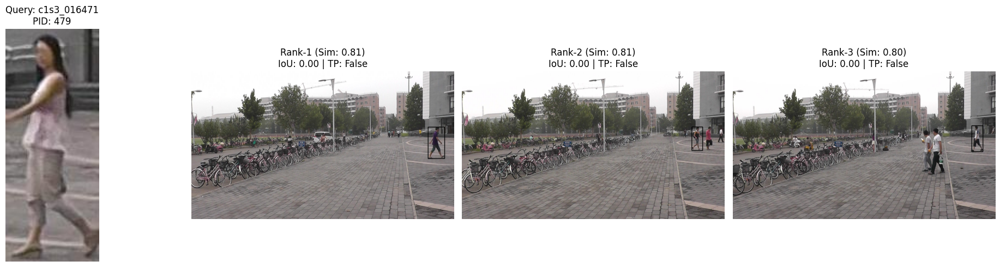

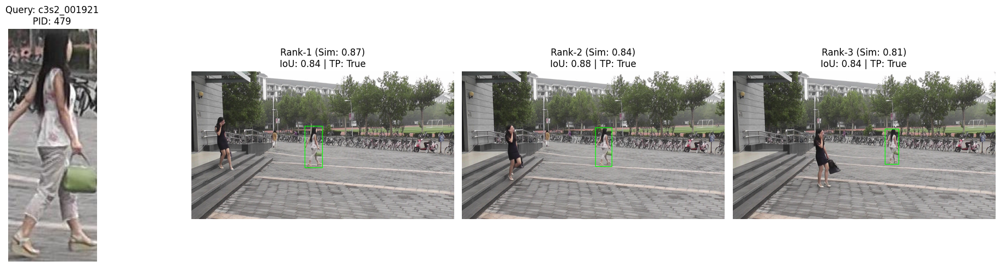

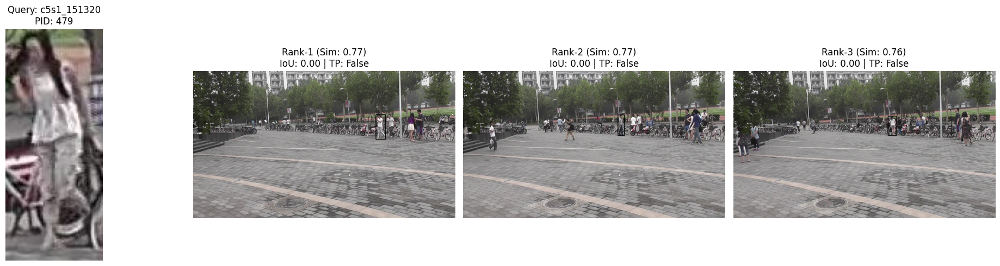

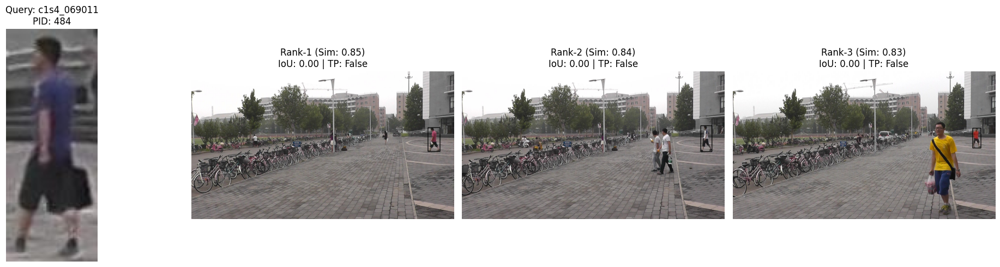

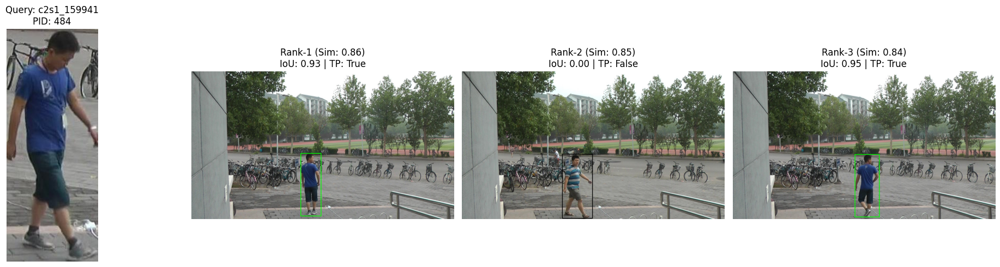

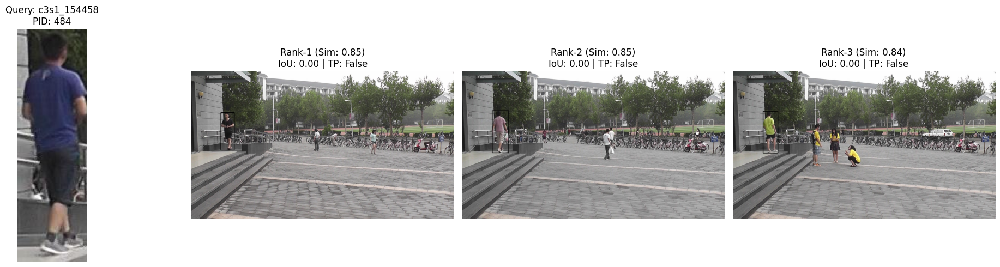

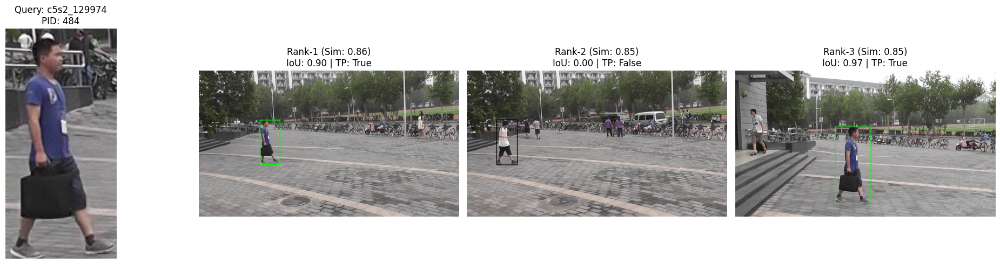

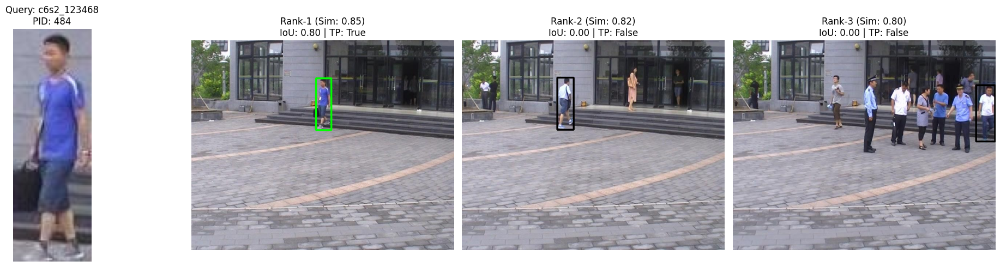

Finish Experiment: resv2_pcb


In [43]:
ablation_configs = [
    {'exp_name': 'res_os', 'backbone': 'resnet50', 'reid': 'osnet', 
     'do_train': False, 'lr': 1e-5, 'epochs': 5, 'batch_size': 8, 'num_workers': 2,
     'score_thresh': 0.8, 'visualization': True},
    {'exp_name': 'resv2_os', 'backbone': 'resnet50_v2', 'reid': 'osnet', 
     'do_train': False, 'lr': 1e-5, 'epochs': 5, 'batch_size': 8, 'num_workers': 2,
     'score_thresh': 0.8, 'visualization': True},
    {'exp_name': 'res_pcb', 'backbone': 'resnet50', 'reid': 'pcb', 
     'do_train': False, 'lr': 1e-5, 'epochs': 5, 'batch_size': 8, 'num_workers': 2,
     'score_thresh': 0.8, 'visualization': True},
    {'exp_name': 'resv2_pcb', 'backbone': 'resnet50_v2', 'reid': 'pcb', 
     'do_train': False, 'lr': 1e-5, 'epochs': 5, 'batch_size': 8, 'num_workers': 2,
     'score_thresh': 0.8, 'visualization': True},
]


for cfg in ablation_configs:
    print(f"Running Experiment: {cfg['exp_name']}")
    run_experiment(cfg)
    print(f"Finish Experiment: {cfg['exp_name']}")

    torch.cuda.empty_cache()
    gc.collect()

In [ ]:
# import os
# import shutil

# # 定义输出路径
# directory = '/kaggle/working'

# # 遍历并删除
# for filename in os.listdir(directory):
#     file_path = os.path.join(directory, filename)
#     try:
#         if os.path.isfile(file_path) or os.path.islink(file_path):
#             os.unlink(file_path) # 删除文件或链接
#         elif os.path.isdir(file_path):
#             shutil.rmtree(file_path) # 删除目录
#         print(f"Deleted: {filename}")
#     except Exception as e:
#         print(f'Failed to delete {file_path}. Reason: {e}')

In [1]:
import os

def list_files(startpath):
    for root, dirs, files in os.walk(startpath):
        level = root.replace(startpath, '').count(os.sep)
        indent = ' ' * 4 * (level)
        print(f"{indent}{os.path.basename(root)}/")
        subindent = ' ' * 4 * (level + 1)
        for f in files:
            print(f"{subindent}{f}")

list_files('/kaggle/working')

working/
    .virtual_documents/
    exps/
        resv2_os/
            ret.pkl
            dets_info.pkl
        resv2_pcb/
            ret.pkl
            dets_info.pkl
        res_pcb/
            ret.pkl
            dets_info.pkl
        res_os/
            ret.pkl
            dets_info.pkl


In [ ]:
# import pickle
# ret_save_path = "/kaggle/working/exps/resv2_os/ret.pkl"
# with open(ret_save_path, "rb") as f:
#     ret = pickle.load(f)
    
# mAP = ret['mAP']
# top1acc = ret['accs']

# print(mAP, top1acc)

# Evaluation of The Experiment Result

## Qualitative Evaluation

The qualitative evaluation is conducted using Query ID 479 as the reference. The detector is Faster R-CNN (ResNet50 / ResNet50_v2), which shows a good detector box extraction result. Therefore, the evaluation will mainly focus on the performance of the embedders. 
Based on the visualized retrieval results, we can observe that: 
Across different detector configurations, the Part-based Convolutional Baseline (PCB) consistently outperforms omni-scale network (OSNet), demonstrating better feature extraction capabilities. This likely due to PCB's uniform partition strategy, which aggregates part-informed features into a comprehensive convolutional descriptor. By segmenting the pedestrian image into horizontal stripes, the model is able to capture fine-grained spatial and structural details, such as body posture and limb orientation, more effectively than global-feature-based models. 

A comparative analysis of the experiments "resv2_os"/"res_os" versus "resv2_pcb"/"res_pcb" reveals distinct behavioral differences: 
* Low-Discriminative Queries: For the 1st query, all models failed to retrieve the correct identity. This failure may be attributed to the lack of discriminative details and the low contrast between the subject’s clothing (trousers) and the background terrain, which hinders the extraction of robust pedestrian features. However, it is noteworthy that the OSNet top-3 results (based on similarity scores) were biased toward subjects with similar clothing colors. This suggests that OSNet’s feature extraction prioritizes global color distributions. In contrast, PCB’s top-3 results showed a higher correlation with bounding box scale (resolution) and anatomical posture, indicating a focus on spatial structure.
* High-Discriminative Queries: In the 2nd query, where the subject is clearer and possesses distinct attributes (e.g., a visible green handbag and high-contrast clothing), PCB successfully retrieved the correct identity in all top-3 results. This confirms that the part-based partitioning effectively captured specific local attributes. Conversely, OSNet exhibited lower precision, failing to leverage these local details as efficiently as the PCB architecture.

--- Visualizing Results for Experiment: resv2_os ---


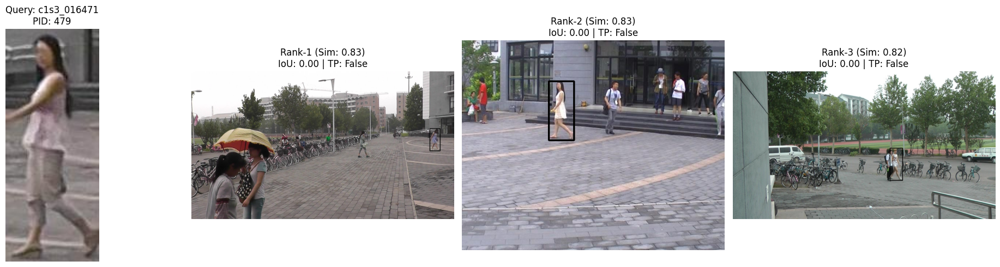

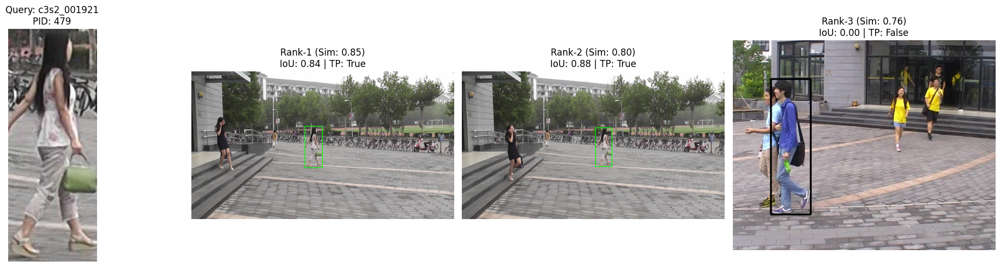

--- Visualizing Results for Experiment: resv2_pcb ---


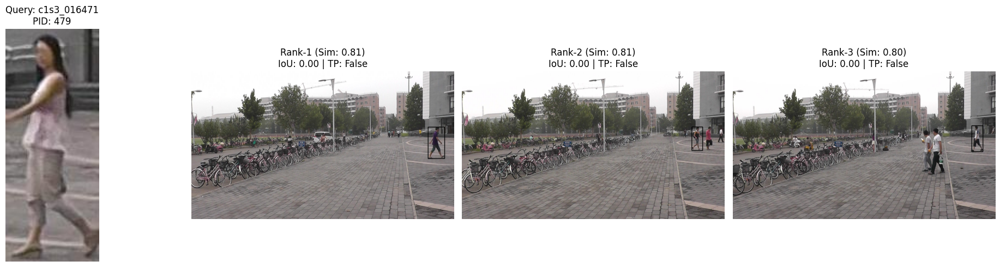

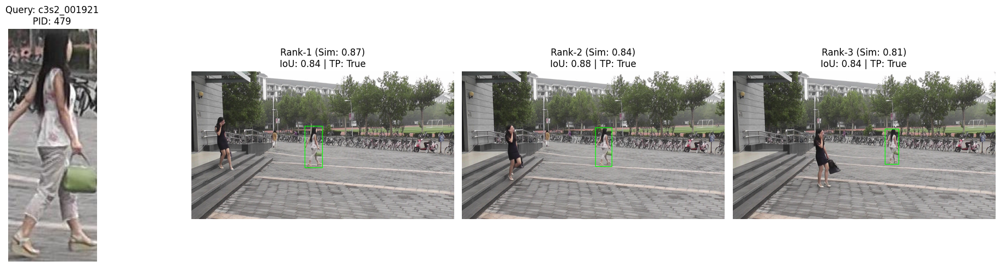

--- Visualizing Results for Experiment: res_pcb ---


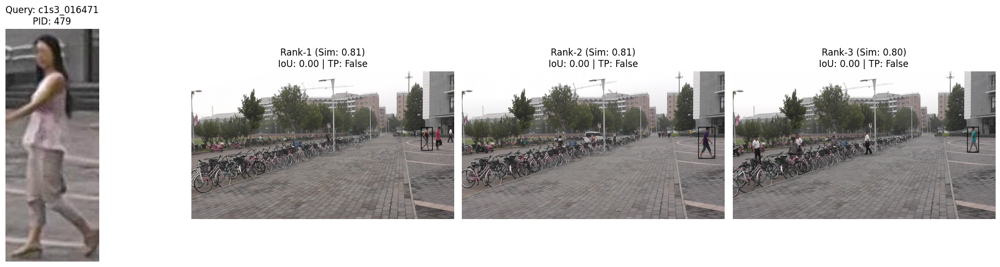

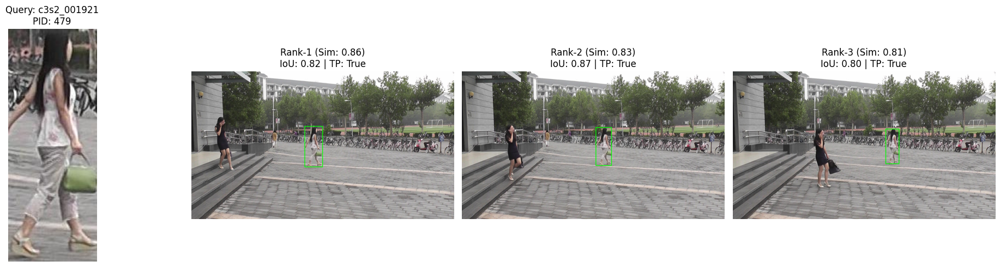

--- Visualizing Results for Experiment: res_os ---


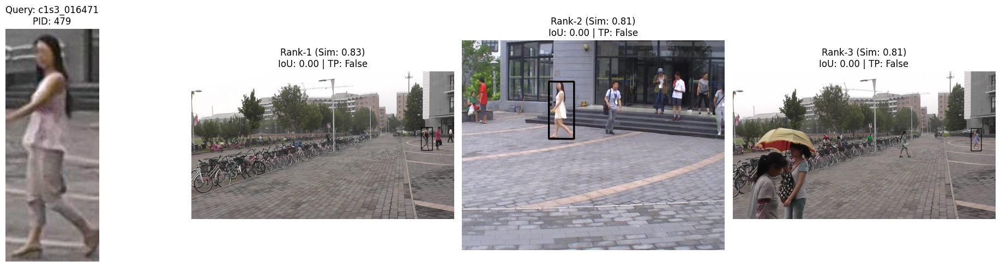

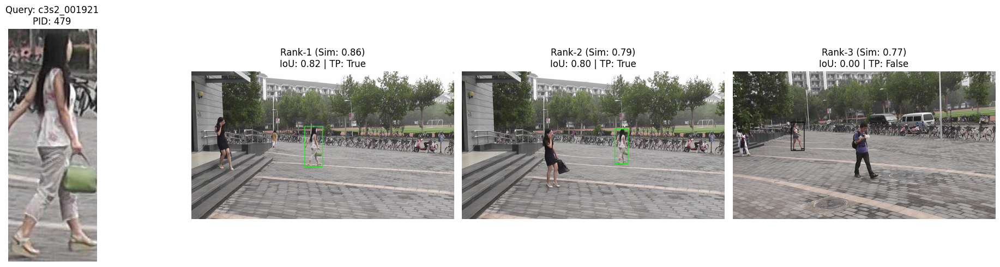

In [9]:
base_path = Path("/kaggle/working/exps")
img_root = "/kaggle/input/prw-person-re-identification-in-the-wild/frames"

for exp_dir in base_path.iterdir():
    if exp_dir.is_dir():
        exp_name = exp_dir.name  
        ret_save_path = exp_dir / "ret.pkl"
        
        if ret_save_path.exists():
            print(f"--- Visualizing Results for Experiment: {exp_name} ---")
            
            with open(ret_save_path, "rb") as f:
                ret = pickle.load(f)
            
            visualize_results(
                ret, 
                img_root=img_root, 
                query_indices=[0, 1]
            )
        else:
            print(f"Warning: {ret_save_path} not found.")

## Quantitative Evaluation

The performance of the person search system is evaluated using mean Average Precision (mAP) and Top-1 Accuracy (Rank-1) metrics.
Based on the quantitative results summarized above, the overall metrics fall significantly below the standard benchmarks for the PRW dataset (where mAP typically approaches 0.5 and Top-1 Accuracy reaches approximately 0.8). Despite the low absolute values, several key insights can be derived:
* Embedder Comparison: When sorting by mAP, the PCB embedder consistently outperforms OSNet, regardless of the detector backbone used. This reinforces the qualitative finding that part-based spatial partitioning provides a more robust descriptor for Re-identification tasks.
* Detector Impact: There is no statistically significant difference in performance when switching between different ResNet detector backbones. This suggests that the detector is not currently the primary bottleneck for this specific architecture configuration.
* Ablation Study: Further ablation tests revealed that utilizing ground-truth detection boxes only improved the mAP to approximately 0.07. This confirms that the performance bottleneck lies within the embedding model rather than the object detector.

The primary reason for the low metrics is the lack of training part for the embedder. In the current project design, training was focused on the detector, while the embedder remained largely unoptimized for the specific feature space of the PRW dataset. Our ablation study indicates that without a fine-tuned Re-ID component, the system cannot effectively bridge the gap between detection and identity matching. Due to time constraints, the training pipeline for the embedder was not fully implemented. Future work will focus on end-to-end training design and PCB fine-tuning.

In [11]:
base_path = Path("/kaggle/working/exps")
results_list = []

for exp_dir in base_path.iterdir():
    if exp_dir.is_dir():
        ret_save_path = exp_dir / "ret.pkl"
        
        if ret_save_path.exists():
            with open(ret_save_path, "rb") as f:
                ret = pickle.load(f)
            
            res_dict = {
                "Experiment": exp_dir.name,
                "mAP": f"{ret['mAP']:.4f}",
                "Top-1 Accuracy": f"{ret['accs'][0]:.4f}"
            }
            results_list.append(res_dict)

df = pd.DataFrame(results_list)

df = df.sort_values(by="mAP", ascending=False)

display(df)

,Experiment,mAP,Top-1 Accuracy
2,res_pcb,0.0658,0.4701
3,resv2_pcb,0.0657,0.4648
0,res_os,0.0650,0.4468
1,resv2_os,0.0650,0.4482


## Ablation Studies

The experiments were conducted using a two-step framework, which separates the object detection and re-identification (Re-ID) tasks. This modular design allows for independent optimization and training of each component, facilitating more targeted debugging and the flexibility to swap different architectures based on specific requirements.

Experimental Setup and Hyperparameter Tuning：  
We evaluated various combinations of detector backbones and Re-ID specific embedder models, the latter being sourced from the torchreid library. To determine the optimal detection threshold, we performed an ablation study on the score_thresh parameter. We tested a range of values $[0.6, 0.7, 0.8, 0.9]$. It was observed that a threshold of 0.8 yielded the best balance between precision and recall, serving as the benchmark for subsequent experiments.

Performance Drivers and Bottlenecks:  
The experimental results indicate that the res_pcb configuration (ResNet50 backbone in detector with PCB embedder) achieved the highest metrics.
* Feature Extraction: The superior performance is primarily attributed to the robust feature extraction capabilities of the Part-based Convolutional Baseline (PCB), which captures spatial details more effectively than global models.
* Model Limitations: While fine-tuning the detector backbones provided marginal performance gains, the primary bottleneck remains the embedder. The current embedding model is not fully aligned with the specific feature space of the PRW dataset, leading to the observed limitations in retrieval accuracy.

## Conclusion

This study demonstrates that the Part-based Convolutional Baseline (PCB) consistently outperforms OSNet in person search tasks on the PRW dataset due to its ability to capture fine-grained spatial features through horizontal partitioning. However, the overall performance remains limited by the lack of domain-specific training for the embedder, indicating that future improvements must focus on jointly optimizing the feature space rather than solely refining the detector.